# Analisi tempesta Vaia

In [1]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap, ScalarMappable
from matplotlib.colors import Normalize
import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature, COLORS, LAND
from wrf import (to_np, getvar, smooth2d, get_cartopy, cartopy_xlim,
                 cartopy_ylim, latlon_coords, interplevel, CoordPair, GeoBounds, vinterp, vertcross)
import numpy as np
from matplotlib.colors import ListedColormap
import pandas as pd
from scipy.interpolate import griddata

In [2]:
# Create the map
states = NaturalEarthFeature(category="cultural", scale="50m",
                             facecolor="none",
                             name="admin_0_boundary_lines_land")

states_l = NaturalEarthFeature(category="physical", scale="50m",
                             facecolor="none",
                             name="admin_0_boundary_lines_land")

land = NaturalEarthFeature(category='physical', name='land',
                                    scale='50m',
                                    facecolor=COLORS['land_alt1'])
ocean = NaturalEarthFeature(category='physical', name='ocean',
                                     scale='50m',
                                     facecolor=COLORS['water'])

In [37]:
ncfile = Dataset("wrfout_d01_2018-10-26_060000")
slp = getvar(ncfile, "slp")
cart_proj = get_cartopy(slp)

ncfile = Dataset("wrfout_d03_2018-10-26_060000")
slp = getvar(ncfile, "slp")
lats, lons = latlon_coords(slp)

In [38]:
print(getvar(ncfile, "lon").max())
print(getvar(ncfile, "lat").max())

print(getvar(ncfile, "lon").min())
print(getvar(ncfile, "lat").min())

<xarray.DataArray 'XLONG' ()>
array(14.167938, dtype=float32)
Coordinates:
    Time     datetime64[ns] 2018-10-26T06:00:00
<xarray.DataArray 'XLAT' ()>
array(47.713833, dtype=float32)
Coordinates:
    Time     datetime64[ns] 2018-10-26T06:00:00
<xarray.DataArray 'XLONG' ()>
array(10.062286, dtype=float32)
Coordinates:
    Time     datetime64[ns] 2018-10-26T06:00:00
<xarray.DataArray 'XLAT' ()>
array(44.93499, dtype=float32)
Coordinates:
    Time     datetime64[ns] 2018-10-26T06:00:00


## Modello per GP vs T

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


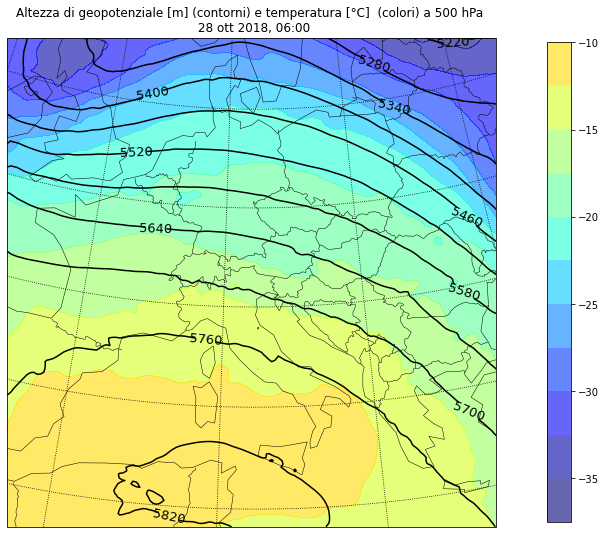

In [8]:
ncfile = Dataset("wrfout_d01_2018-10-26_060000")

# Get the geopotential height, the pressure profile and the temperature in Celsius degrees
gpt = getvar(ncfile, "z")
p = getvar(ncfile, "pressure")
t = getvar(ncfile, "tc")


# Interpolate the geopotential height and the temperature at 500 hPa
interp_gpt = interplevel(gpt, p, 500)
interp_t = interplevel(t, p, 500)

# Smooth the sea level pressure since it tends to be noisy near the
# mountains
#smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
lats, lons = latlon_coords(interp_gpt)

# Get the cartopy mapping object
cart_proj = get_cartopy(interp_gpt)

# Create a figure
fig = plt.figure(figsize=(18,9))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines

ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('110m', linewidth=.5, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
cs = plt.contour(to_np(lons), to_np(lats), to_np(interp_gpt), 10, colors="black", 
            transform=crs.PlateCarree())
ax.clabel(cs, inline=1, fontsize=13, colors = 'black')

plt.contourf(to_np(lons), to_np(lats), to_np(interp_t), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("jet"), alpha = 0.6,
            vmin = -35, vmax = 0)

# Add a color bar
plt.colorbar(ax=ax, shrink=.98)

# Set the map bounds
ax.set_xlim(cartopy_xlim(interp_gpt))
ax.set_ylim(cartopy_ylim(interp_gpt))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

plt.title("Altezza di geopotenziale [m] (contorni) e temperatura [°C]  (colori) a 500 hPa \n 28 ott 2018, 06:00")

plt.show()


C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


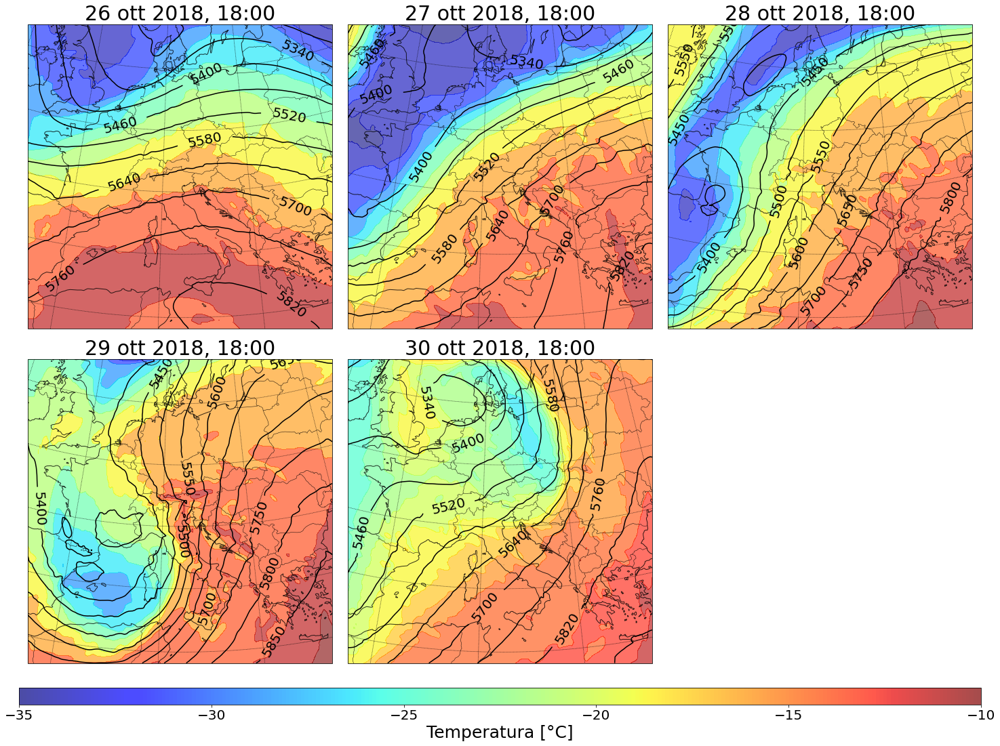

In [83]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["26", "27", "28", "29", "30"]

#fig.suptitle("Altezza di geopotenziale [m] (contorni) e temperatura [°C] (colori) a 500 hPa",
#            fontsize = 30)

for i, ax in zip(days_list, axs.ravel()):
    namefile = "wrfout_d01_2018-10-"+i+"_180000"
    ncfile = Dataset(namefile)

# Get the geopotential height, the pressure profile and the temperature in Celsius degrees
    gpt = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    t = getvar(ncfile, "tc")


# Interpolate the geopotential height and the temperature at 500 hPa
    interp_gpt = interplevel(gpt, p, 500)
    interp_t = interplevel(t, p, 500)

# Smooth the sea level pressure since it tends to be noisy near the
# mountains
#smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
    lats, lons = latlon_coords(interp_gpt)

# Download and add the states and coastlines

    ax.add_feature(states, linewidth=.6, edgecolor="black", zorder = 2, alpha = 0.8)
    ax.coastlines('50m', linewidth=1, zorder = 2, alpha = 0.8)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
    cs = ax.contour(to_np(lons), to_np(lats), to_np(interp_gpt), 10, colors="black", 
            transform=crs.PlateCarree())
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)
    ax.contourf(to_np(lons), to_np(lats), to_np(interp_t), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("jet"), alpha = 0.6,
               vmin = -35, vmax = -10)


# Set the map bounds
    ax.set_xlim(cartopy_xlim(interp_gpt))
    ax.set_ylim(cartopy_ylim(interp_gpt))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")

    ax.set_title(i + " ott 2018, 18:00",
                fontsize = 30)
# Add a color bar

fig.delaxes(axs[1,2])

fig.tight_layout()


cmap = get_cmap("jet")
cmappable = ScalarMappable(norm=Normalize(-35,-10), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.7)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Temperatura [°C]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)

#fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

fig.savefig('gph+t.pdf', bbox_inches='tight')

## Sea Level Pressure

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


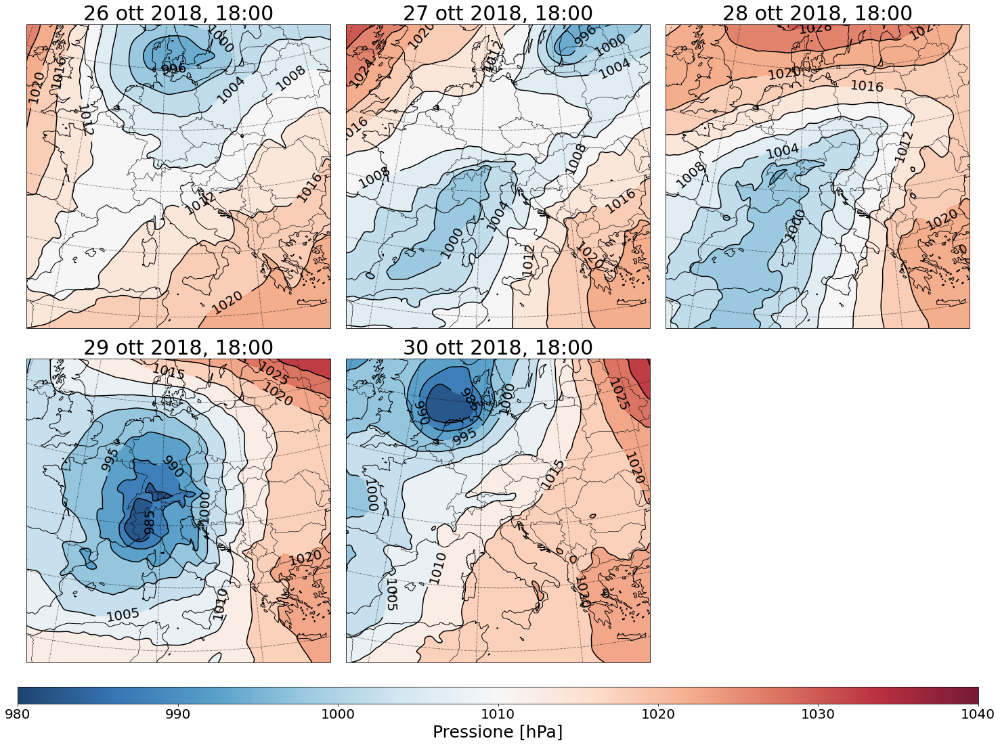

In [5]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["26", "27", "28", "29", "30"]

#fig.suptitle("Pressione al livello del mare [hPa]",
#            fontsize = 30)

for i, ax in zip(days_list, axs.ravel()):
    namefile = "wrfout_d01_2018-10-"+i+"_180000"
    ncfile = Dataset(namefile)

# Get the sea level pressure
    slp = getvar(ncfile, "slp")

# Smooth the sea level pressure since it tends to be noisy near the
# mountains
    smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
    lats, lons = latlon_coords(slp)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.6, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
    cs = ax.contour(to_np(lons), to_np(lats), to_np(smooth_slp), 10, colors="black",
            transform=crs.PlateCarree())
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)
    
    ax.contourf(to_np(lons), to_np(lats), to_np(smooth_slp), 10,
             transform=crs.PlateCarree(), alpha = 0.9,
             cmap=get_cmap("RdBu_r"), vmin = 980, vmax = 1040)

# Set the map bounds
    ax.set_xlim(cartopy_xlim(smooth_slp))
    ax.set_ylim(cartopy_ylim(smooth_slp))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")


    ax.set_title(i + " ott 2018, 18:00",
                fontsize = 30)
# Add a color bar

fig.delaxes(axs[1,2])

fig.tight_layout()


cmap = get_cmap("RdBu_r")
cmappable = ScalarMappable(norm=Normalize(980,1040), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.9)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Pressione [hPa]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)

#fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

fig.savefig('slp.pdf', bbox_inches='tight')

## Umidità relativa e vento a 700 hPa

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


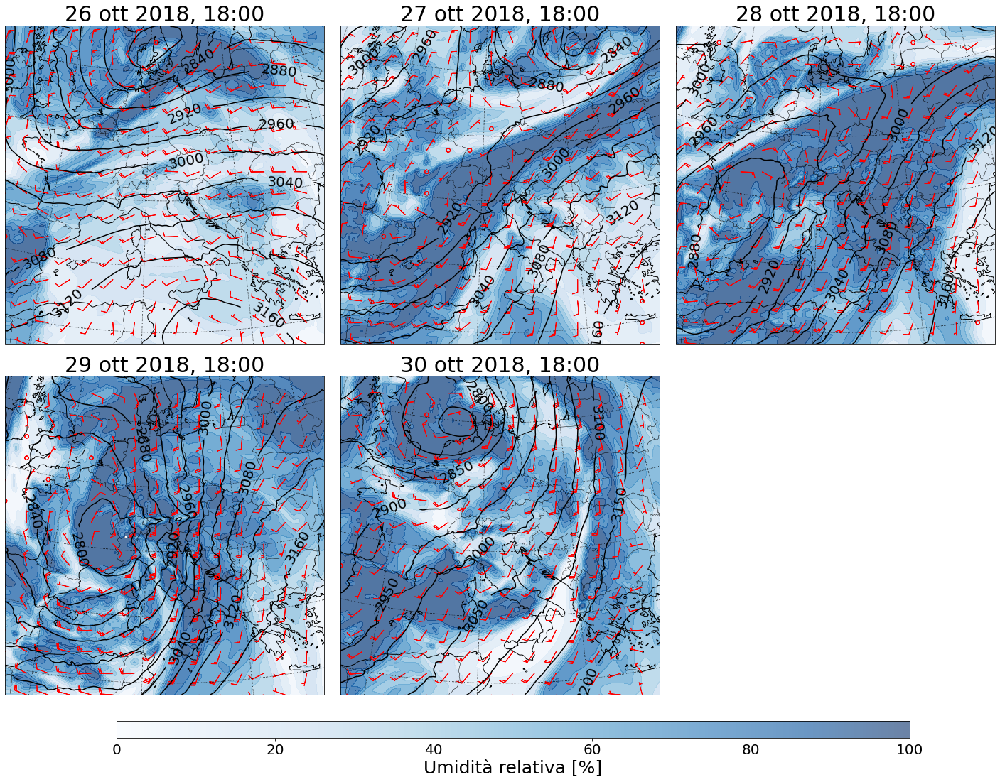

In [85]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["26", "27", "28", "29", "30"]

#fig.suptitle("Umidità relativa, direzione del vento e altezza di geopotenziale a 700 hPa",
#            fontsize = 30)

for i, ax in zip(days_list, axs.ravel()):
    namefile = "wrfout_d01_2018-10-"+i+"_180000"
    ncfile = Dataset(namefile)

# Get the sea level pressure
    rh = getvar(ncfile, "rh")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    wspd = getvar(ncfile, "wspd_wdir")
    gpt = getvar(ncfile, "z")
    
# Interpolate the variables at 700 hPa

    rh_700 = interplevel(rh, p, 700)
    ua_700 = interplevel(ua, p, 700)
    va_700 = interplevel(va, p, 700)
    wspd_700 = interplevel(wspd, p, 700)
    gpt_700 = interplevel(gpt, p, 700)

# Get the latitude and longitude points
    lats, lons = latlon_coords(rh_700)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)

# Wind barbs
    ax.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_700[::10, ::10]), to_np(va_700[::10, ::10]), color = 'red',
          transform=crs.PlateCarree(), length=6, zorder = 2)

# Contour lines for geopotential height at 700 hPa
    cs = ax.contour(to_np(lons), to_np(lats), to_np(gpt_700), 10,
             transform=crs.PlateCarree(),
             colors="black", vmin = 0, vmax = 100, zorder = 2)
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)


# Contour lines for humidity
    ax.contourf(to_np(lons), to_np(lats), to_np(rh_700), 10,
             transform=crs.PlateCarree(), alpha = 0.7,
             cmap=get_cmap("Blues"), vmin = 0, vmax = 100)

# Set the map bounds
    ax.set_xlim(cartopy_xlim(smooth_slp))
    ax.set_ylim(cartopy_ylim(smooth_slp))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")
    ax.set_title(i + " ott 2018, 18:00",
                fontsize = 30)
# Add a color bar

fig.delaxes(axs[1,2])

#fig.tight_layout()


cmap = get_cmap("Blues")
cmappable = ScalarMappable(norm=Normalize(0,100), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.6)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Umidità relativa [%]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)

#fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

fig.savefig('rh+wind.pdf', bbox_inches='tight')

### Equivalent potential temperature e vento 700 hPa

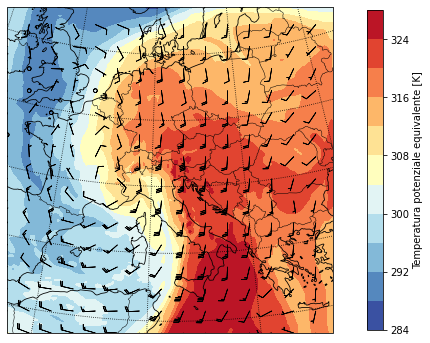

In [87]:
ept = getvar(ncfile, "theta_e", units = "K")
ua = getvar(ncfile, "ua")
va = getvar(ncfile, "va")
p = getvar(ncfile, "pressure")

ept_int = interplevel(ept, p, 700)
ua_int = interplevel(ua, p, 700)
va_int = interplevel(va, p, 700)

lats, lons = latlon_coords(ept_int)

#ept_int = smooth2d(ept_int, 3, cenweight = 2)
# Get the cartopy mapping object
cart_proj = get_cartopy(ept_int)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contourf(to_np(lons), to_np(lats), to_np(ept_int), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("RdYlBu_r"))

ax.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_int[::10, ::10]), to_np(va_int[::10, ::10]), color = 'black',
          transform=crs.PlateCarree(), length=5, zorder = 2, linewidth = .8)

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)
cbar.set_label("Temperatura potenziale equivalente [K]")
# Set the map bounds
ax.set_xlim(cartopy_xlim(ept_int))
ax.set_ylim(cartopy_ylim(ept_int))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

#plt.title("Sea Level Pressure (hPa)")

### Precipitable water

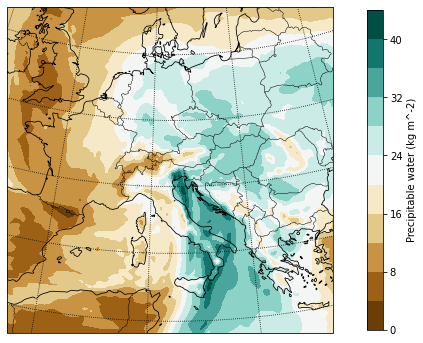

In [88]:
pw = getvar(ncfile, "pw")
p = getvar(ncfile, "pressure")

#pw_int = interplevel(ept, p, 700)

lats, lons = latlon_coords(pw)

#ept_int = smooth2d(ept_int, 3, cenweight = 2)
# Get the cartopy mapping object
cart_proj = get_cartopy(pw)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contourf(to_np(lons), to_np(lats), to_np(pw), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"))

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)
cbar.set_label("Precipitable water (kg m^-2)")
# Set the map bounds
ax.set_xlim(cartopy_xlim(pw))
ax.set_ylim(cartopy_ylim(pw))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

#plt.title("Sea Level Pressure (hPa)")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


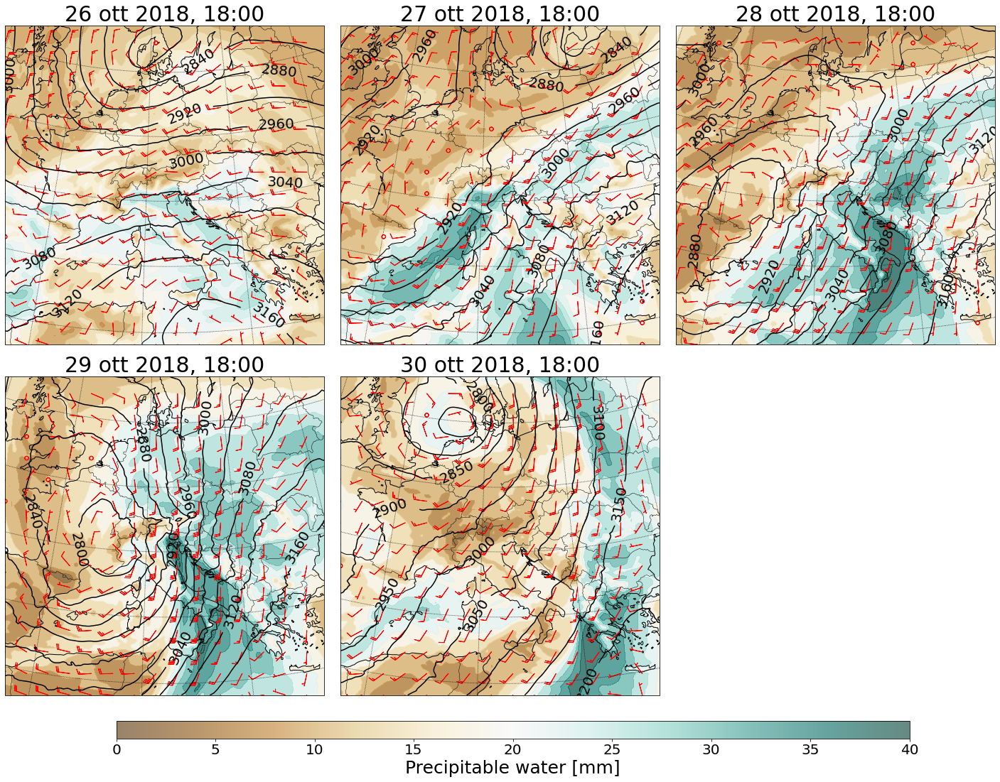

In [89]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["26", "27", "28", "29", "30"]

for i, ax in zip(days_list, axs.ravel()):
    namefile = "wrfout_d01_2018-10-"+i+"_180000"
    ncfile = Dataset(namefile)

# Get the sea level pressure
    pw = getvar(ncfile, "pw")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    wspd = getvar(ncfile, "wspd_wdir")
    gpt = getvar(ncfile, "z")
    
# Interpolate the variables at 700 hPa

    ua_700 = interplevel(ua, p, 700)
    va_700 = interplevel(va, p, 700)
    wspd_700 = interplevel(wspd, p, 700)
    gpt_700 = interplevel(gpt, p, 700)

# Get the latitude and longitude points
    lats, lons = latlon_coords(rh_700)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)

# Wind barbs
    ax.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_700[::10, ::10]), to_np(va_700[::10, ::10]), color = 'red',
          transform=crs.PlateCarree(), length=6, zorder = 2)

# Contour lines for geopotential height at 700 hPa
    cs = ax.contour(to_np(lons), to_np(lats), to_np(gpt_700), 10,
             transform=crs.PlateCarree(),
             colors='black', zorder = 2)
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)


# Contour lines for precipitable water
    ax.contourf(to_np(lons), to_np(lats), to_np(pw), 10,
             transform=crs.PlateCarree(), alpha = 0.7,
             cmap=get_cmap("BrBG"), vmin = 0, vmax = 40)

# Set the map bounds
    ax.set_xlim(cartopy_xlim(smooth_slp))
    ax.set_ylim(cartopy_ylim(smooth_slp))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")
    ax.set_title(i + " ott 2018, 18:00",
                fontsize = 30)
# Add a color bar

fig.delaxes(axs[1,2])

#fig.tight_layout()


cmap = get_cmap("BrBG")
cmappable = ScalarMappable(norm=Normalize(0,40), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.6)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Precipitable water [mm]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)


fig.savefig('pw+wind.pdf', bbox_inches='tight')

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


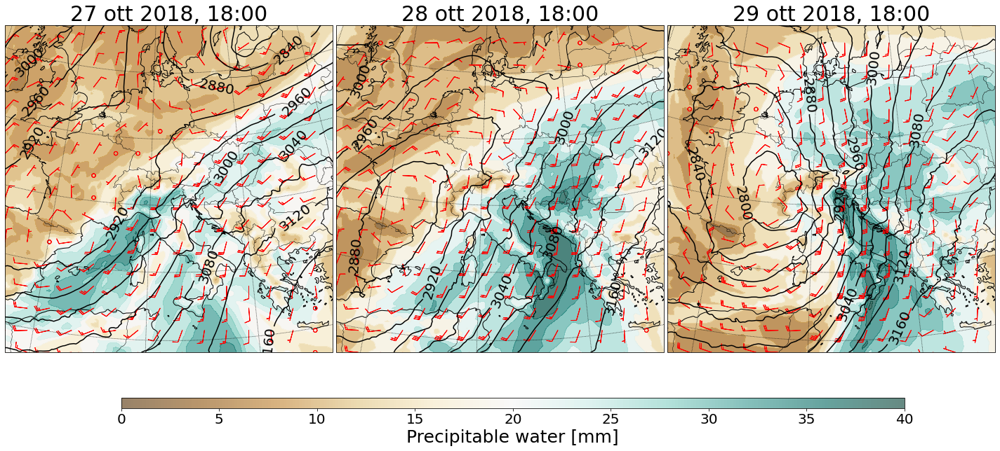

In [19]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 10), subplot_kw = {'projection' : cart_proj})

days_list = ["27", "28", "29"]

for i, ax in zip(days_list, axs.ravel()):
    namefile = "wrfout_d01_2018-10-"+i+"_180000"
    ncfile = Dataset(namefile)

# Get the sea level pressure
    pw = getvar(ncfile, "pw")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    wspd = getvar(ncfile, "wspd_wdir")
    gpt = getvar(ncfile, "z")
    
# Interpolate the variables at 700 hPa

    ua_700 = interplevel(ua, p, 700)
    va_700 = interplevel(va, p, 700)
    wspd_700 = interplevel(wspd, p, 700)
    gpt_700 = interplevel(gpt, p, 700)

# Get the latitude and longitude points
    lats, lons = latlon_coords(pw)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)

# Wind barbs
    ax.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_700[::10, ::10]), to_np(va_700[::10, ::10]), color = 'red',
          transform=crs.PlateCarree(), length=6, zorder = 2)

# Contour lines for geopotential height at 700 hPa
    cs = ax.contour(to_np(lons), to_np(lats), to_np(gpt_700), 10,
             transform=crs.PlateCarree(),
             colors='black', zorder = 2)
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)


# Contour lines for precipitable water
    ax.contourf(to_np(lons), to_np(lats), to_np(pw), 10,
             transform=crs.PlateCarree(), alpha = 0.7,
             cmap=get_cmap("BrBG"), vmin = 0, vmax = 40)

# Set the map bounds
    ax.set_xlim(cartopy_xlim(smooth_slp))
    ax.set_ylim(cartopy_ylim(smooth_slp))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")
    ax.set_title(i + " ott 2018, 18:00",
                fontsize = 30)
# Add a color bar

#fig.delaxes(axs[1,2])

#fig.tight_layout()


cmap = get_cmap("BrBG")
cmappable = ScalarMappable(norm=Normalize(0,40), cmap=cmap)

p0 = axs[0].get_position().get_points().flatten()
p1 = axs[2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.6)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Precipitable water [mm]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)


fig.savefig('pw+wind_3.pdf', bbox_inches='tight')

## 29 ottobre

### Venti a 10 m e 300 hPa alle 18

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


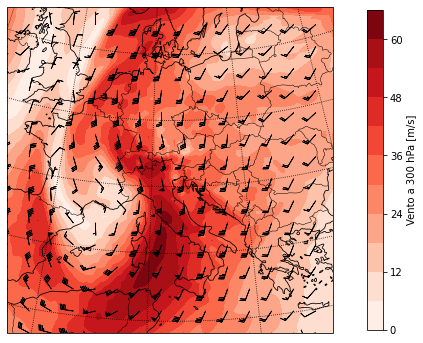

In [6]:
ncfile = Dataset("wrfout_d01_2018-10-29_180000")

ua = getvar(ncfile, "ua")
va = getvar(ncfile, "va")
p = getvar(ncfile, "pressure")
wspd = getvar(ncfile, "wspd_wdir")[0,:]

# Venti a 300 hPa
ua_int = interplevel(ua, p, 300)
va_int = interplevel(va, p, 300)
wspd_int = interplevel(wspd, p, 300)


lats, lons = latlon_coords(ua_int)


cart_proj = get_cartopy(ua_int)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contourf(to_np(lons), to_np(lats), to_np(wspd_int), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("Reds"))

plt.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_int[::10, ::10]), to_np(va_int[::10, ::10]), color = 'black',
          transform=crs.PlateCarree(), length=5, zorder = 2, linewidth = .8)

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)
cbar.set_label("Vento a 300 hPa [m/s]")

ax.set_xlim(cartopy_xlim(ua_int))
ax.set_ylim(cartopy_ylim(ua_int))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

#plt.title("Sea Level Pressure (hPa)")

plt.savefig('wind_300hPa_2910.pdf', bbox_inches = "tight")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


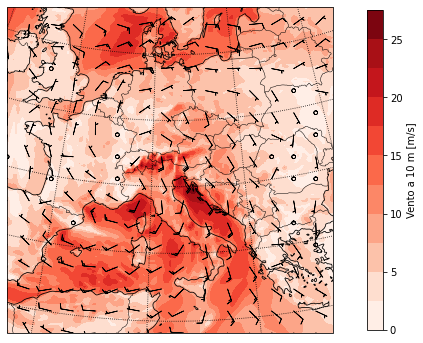

In [7]:
u10 = getvar(ncfile, "U10") 
v10 = getvar(ncfile, "V10")
wspd10 = getvar(ncfile, "wspd_wdir10")[0,:]

lats, lons = latlon_coords(u10)


cart_proj = get_cartopy(u10)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contourf(to_np(lons), to_np(lats), to_np(wspd10), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("Reds"))

plt.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(u10[::10, ::10]), to_np(v10[::10, ::10]), color = 'black',
          transform=crs.PlateCarree(), length=5, zorder = 2, linewidth = .8)

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)
cbar.set_label("Vento a 10 m [m/s]")

ax.set_xlim(cartopy_xlim(u10))
ax.set_ylim(cartopy_ylim(u10))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")
plt.savefig('wind_10m_2910.pdf', bbox_inches = "tight")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


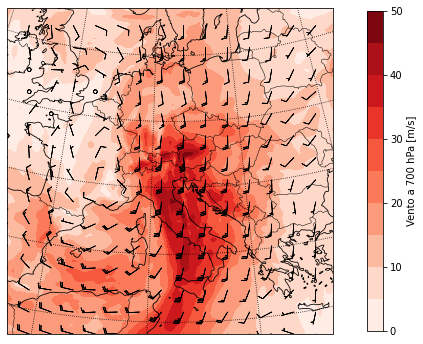

In [6]:
ncfile = Dataset("wrfout_d01_2018-10-29_180000")

ua = getvar(ncfile, "ua")
va = getvar(ncfile, "va")
p = getvar(ncfile, "pressure")
wspd = getvar(ncfile, "wspd_wdir")[0,:]

# Venti a 300 hPa
ua_int = interplevel(ua, p, 700)
va_int = interplevel(va, p, 700)
wspd_int = interplevel(wspd, p, 700)


lats, lons = latlon_coords(ua_int)


cart_proj = get_cartopy(ua_int)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contourf(to_np(lons), to_np(lats), to_np(wspd_int), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("Reds"))

plt.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_int[::10, ::10]), to_np(va_int[::10, ::10]), color = 'black',
          transform=crs.PlateCarree(), length=5, zorder = 2, linewidth = .8)

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)
cbar.set_label("Vento a 700 hPa [m/s]")

ax.set_xlim(cartopy_xlim(ua_int))
ax.set_ylim(cartopy_ylim(ua_int))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

#plt.title("Sea Level Pressure (hPa)")

plt.savefig('wind_700hPa_2910.pdf', bbox_inches = "tight")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


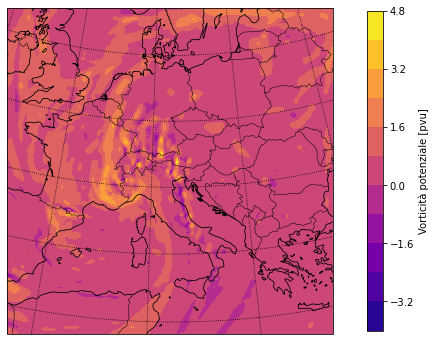

In [110]:
ncfile = Dataset("wrfout_d01_2018-10-29_180000")

# Get the sea level pressure
pv = getvar(ncfile, "pvo")
p = getvar(ncfile, "pressure")

pv_int = interplevel(pv, p, 700)

# Get the latitude and longitude points
lats, lons = latlon_coords(pv)

# Get the cartopy mapping object
cart_proj = get_cartopy(pv)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines

ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.

plt.contourf(to_np(lons), to_np(lats), to_np(pv_int), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("plasma"))

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)

# Set the map bounds
ax.set_xlim(cartopy_xlim(pv_int))
ax.set_ylim(cartopy_ylim(pv_int))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

cbar.set_label("Vorticità potenziale [pvu]")

plt.savefig("pv_700.pdf", bbox_inches = "tight")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


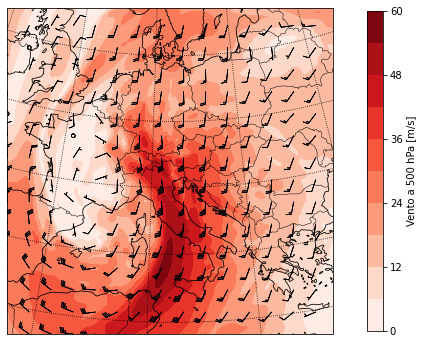

In [5]:
ncfile = Dataset("wrfout_d01_2018-10-29_180000")

ua = getvar(ncfile, "ua")
va = getvar(ncfile, "va")
p = getvar(ncfile, "pressure")
wspd = getvar(ncfile, "wspd_wdir")[0,:]

# Venti a 300 hPa
ua_int = interplevel(ua, p, 500)
va_int = interplevel(va, p, 500)
wspd_int = interplevel(wspd, p, 500)


lats, lons = latlon_coords(ua_int)


cart_proj = get_cartopy(ua_int)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contourf(to_np(lons), to_np(lats), to_np(wspd_int), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("Reds"))

plt.barbs(to_np(lons[::10,::10]), to_np(lats[::10,::10]),
          to_np(ua_int[::10, ::10]), to_np(va_int[::10, ::10]), color = 'black',
          transform=crs.PlateCarree(), length=5, zorder = 2, linewidth = .8)

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)
cbar.set_label("Vento a 500 hPa [m/s]")

ax.set_xlim(cartopy_xlim(ua_int))
ax.set_ylim(cartopy_ylim(ua_int))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

#plt.title("Sea Level Pressure (hPa)")

plt.savefig('wind_500hPa_2910.pdf', bbox_inches = "tight")

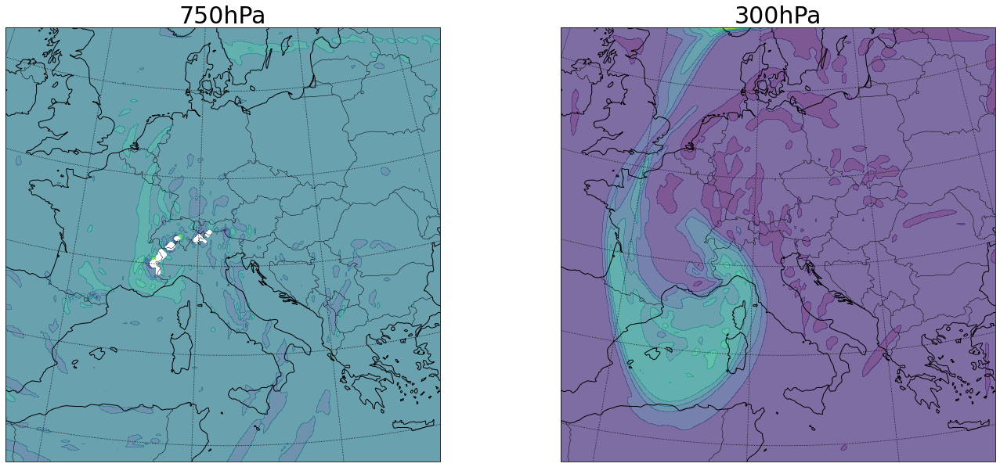

In [90]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20, 10), subplot_kw = {'projection' : cart_proj})

namefile = "wrfout_d01_2018-10-29_180000"
ncfile = Dataset(namefile)


height_list = [700, 300]

for i, ax in zip(height_list, axs.ravel()):


# Get the sea level pressure
    pv = getvar(ncfile, "pvo")
    p = getvar(ncfile, "pressure")
    
# Interpolate the variables at 700 hPa

    pv_int = interplevel(pv, p, i)
   

    #pv_int = vinterp(pv, p, vert_coord = 'pressure', extrapolate = True, interp_levels = interp_levels)
# Get the latitude and longitude points
    lats, lons = latlon_coords(pv)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)


    ax.contourf(to_np(lons), to_np(lats), to_np(pv_int), 10,
             transform=crs.PlateCarree(), alpha = 0.7,
             cmap=get_cmap("viridis"))

# Set the map bounds
    ax.set_xlim(cartopy_xlim(pv))
    ax.set_ylim(cartopy_ylim(pv))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")
    ax.set_title(str(i) + "hPa",
                fontsize = 30)
# Add a color bar


cmap = get_cmap("BrBG")
cmappable = ScalarMappable(norm=Normalize(0,40), cmap=cmap)

p0 = axs[0].get_position().get_points().flatten()
p1 = axs[2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.6)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Precipitable water [mm]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)


#fig.savefig('pw+wind_3.pdf', bbox_inches='tight')

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


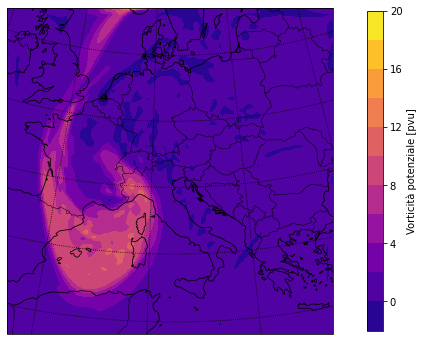

In [113]:
ncfile = Dataset("wrfout_d01_2018-10-29_180000")

# Get the sea level pressure
pv = getvar(ncfile, "pvo")
p = getvar(ncfile, "pressure")

pv_int = interplevel(pv, p, 300)

# Get the latitude and longitude points
lats, lons = latlon_coords(pv)

# Get the cartopy mapping object
cart_proj = get_cartopy(pv)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines

ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.

plt.contourf(to_np(lons), to_np(lats), to_np(pv_int), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("plasma"))

# Add a color bar
cbar = plt.colorbar(ax=ax, shrink=.98)

# Set the map bounds
ax.set_xlim(cartopy_xlim(pv_int))
ax.set_ylim(cartopy_ylim(pv_int))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

cbar.set_label("Vorticità potenziale [pvu]")

plt.savefig("pv_300.pdf", bbox_inches = "tight")

## Analisi dominio 3

### Stazioni meteo del Veneto

In [243]:
dati_prec = pd.read_csv('dati_veneto/Dati_PREC.txt', sep=';')
coord_staz = pd.read_csv('dati_veneto/AnagrafeStazioni.txt', sep = ';', encoding = 'latin-1', usecols = [0, 1, 4, 7, 8 ])
dati_spd = pd.read_csv('dati_veneto/Dati_VVENTO.txt',  sep = ';', encoding = 'latin-1')
dati_dir = pd.read_csv('dati_veneto/Dati_VDIREZ.txt',  sep = ';', encoding = 'latin-1')

In [246]:
dati_prec.DataOra

0         27/10/2018 00:05
1         27/10/2018 00:10
2         27/10/2018 00:15
3         27/10/2018 00:20
4         27/10/2018 00:25
                ...       
194875    30/10/2018 23:40
194876    30/10/2018 23:45
194877    30/10/2018 23:50
194878    30/10/2018 23:55
194879    31/10/2018 00:00
Name: DataOra, Length: 194880, dtype: object

(-139952.6029938927, 158047.62264119028)

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:836: ShapelyDeprecationWarning: __l

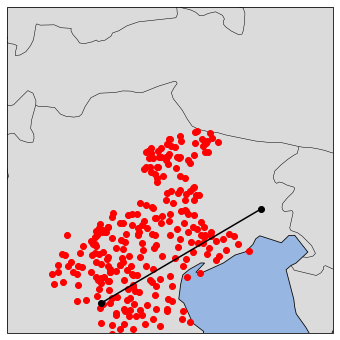

In [9]:
ncfile = Dataset("wrfout_d03_2018-10-26_000000")

slp = getvar(ncfile, "slp")
lats, lons = latlon_coords(slp)
cart_proj_d03 = get_cartopy(slp)


fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj_d03)

# Download and add the states and coastlines
#ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

ax.add_feature(LAND)
ax.add_feature(ocean)
ax.add_feature(land)
ax.add_feature(states, linewidth=.5, edgecolor="black")

#ax.text(15, 'Mar Adriatico')

# Start ed end point 
start_point = CoordPair(lat=45.2, lon=11.29)
end_point = CoordPair(lat=46.0, lon=13.23)


staz_coords = []
for i, j in zip(coord_staz.EPSG4258_LAT, coord_staz.EPSG4258_LON):
    staz_coords += [CoordPair(lat=i, lon=j)]
    

ax.plot([start_point.lon, end_point.lon],
            [start_point.lat, end_point.lat], color="black", marker="o",
            transform=crs.PlateCarree(), zorder=5)

ax.scatter([staz_coords[i].lon for i in range(len(staz_coords))], [staz_coords[i].lat for i in range(len(staz_coords))],
       transform=crs.PlateCarree(), zorder = 4, color = 'red')

ax.set_xlim(cartopy_xlim(slp))
ax.set_ylim(cartopy_ylim(slp))

In [73]:
## TENTATIVO CON WRF

ncfile = Dataset("wrfout_d03_2018-10-30_000000")

rainc, rainnc, rainsh = getvar(ncfile, "RAINC"), getvar(ncfile, "RAINNC"),  getvar(ncfile, "RAINSH")

tp_new = to_np(rainc) + to_np(rainnc) + to_np(rainsh)

ncfile = Dataset("wrfout_d03_2018-10-27_000000")

rainc, rainnc, rainsh = getvar(ncfile, "RAINC"), getvar(ncfile, "RAINNC"),  getvar(ncfile, "RAINSH")

tp_old = to_np(rainc) + to_np(rainnc) + to_np(rainsh)

lats, lons = latlon_coords(rainc)

In [74]:
tp = tp_new - tp_old

In [248]:
dati_prec = dati_prec[dati_prec.DataOra < "30/10/2018 18:00"]

In [249]:
#dati_prec[["CodiceStazione", "Valore"]].groupby("CodiceStazione").sum()
dati_prec = dati_prec[dati_prec.Valore != ">>"]
dati_prec.Valore = dati_prec.Valore.apply(float)

dati_prec = pd.merge(coord_staz, dati_prec[["CodiceStazione", "Valore"]].groupby("CodiceStazione").sum(), on = "CodiceStazione")

lats_staz = dati_prec.EPSG4258_LAT.to_numpy()
lons_staz = dati_prec.EPSG4258_LON.to_numpy()

prec = dati_prec.Valore.to_numpy()

staz_coords = []
for i, j in zip(coord_staz.EPSG4258_LAT, coord_staz.EPSG4258_LON):
    staz_coords += [CoordPair(lat=i, lon=j)]
    
#coord_staz

In [250]:
data_grid = griddata(points = (lats_staz, lons_staz), values = prec, xi = (lats, lons), method = "linear")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


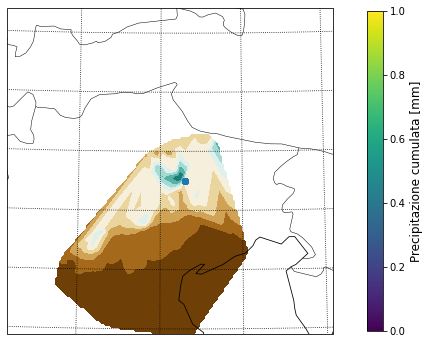

In [251]:
fig = plt.figure(figsize = (12,6))

ax = plt.axes(projection = cart_proj)
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder=2)
ax.coastlines("50m", linewidth=.8, zorder=2)

plt.contourf(lons, lats, data_grid, 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"), vmin = 0, vmax = 800)

plt.scatter(lons_staz, lats_staz)

#ax.set_xlim([min(lons_staz), max(lons_staz)])
#ax.set_ylim([min(lats_staz), max(lats_staz)])
cbar = plt.colorbar(ax=ax, shrink=.98)

cbar.set_label("Precipitazione cumulata [mm]", fontsize = 12)

ax.gridlines(color="black", linestyle="dotted")

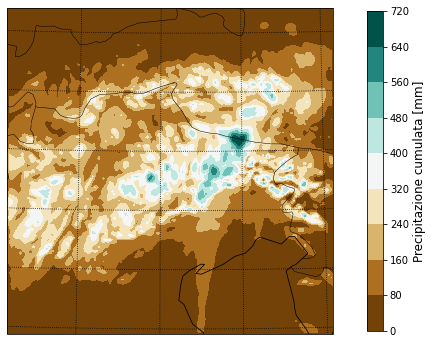

In [252]:
fig = plt.figure(figsize = (12,6))

ax = plt.axes(projection = cart_proj)
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder=2)
ax.coastlines("50m", linewidth=.8, zorder=2)

plt.contourf(lons, lats, tp, 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"))

#plt.scatter(lons_staz, lats_staz, prec)

#ax.set_xlim([min(lons_staz), max(lons_staz)])
#ax.set_ylim([min(lats_staz), max(lats_staz)])
cbar = plt.colorbar(ax=ax, shrink=.98)

cbar.set_label("Precipitazione cumulata [mm]", fontsize = 12)

ax.gridlines(color="black", linestyle="dotted")

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


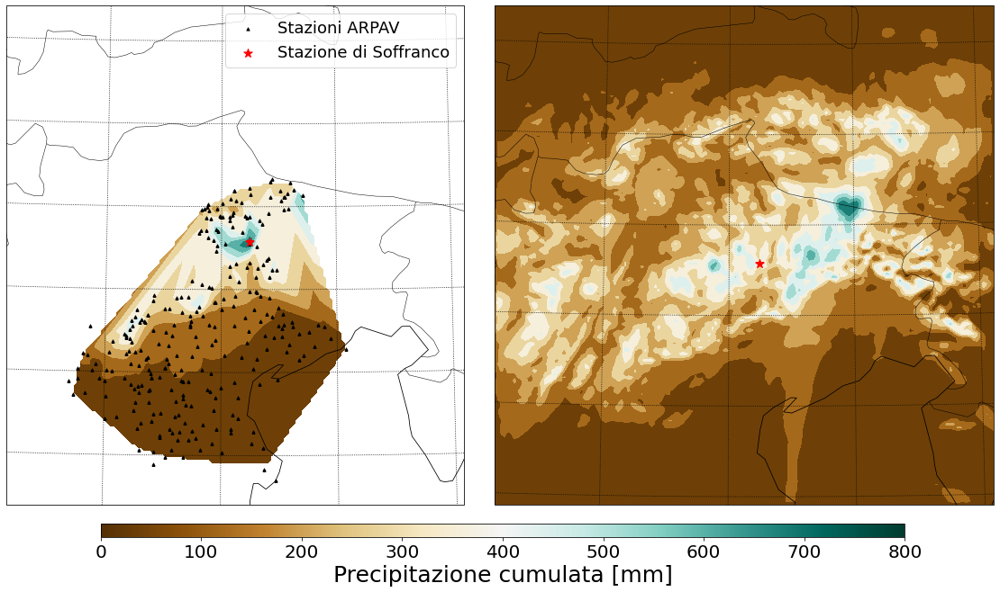

In [253]:
fig, axs = plt.subplots(figsize = (16,10), nrows = 1, ncols = 2, subplot_kw = {"projection" : cart_proj})

axs[0].add_feature(states, linewidth=.5, edgecolor="black", zorder=2)
axs[0].coastlines("50m", linewidth=.8, zorder=2)

axs[0].contourf(to_np(lons), to_np(lats), data_grid, 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"), vmin = 0, vmax = 800)

axs[0].gridlines(color="black", linestyle="dotted")

axs[0].scatter([staz_coords[i].lon for i in range(len(staz_coords))], [staz_coords[i].lat for i in range(len(staz_coords))],
               transform=crs.PlateCarree(), zorder = 4, color = 'black', s = 10, marker = "^", label = "Stazioni ARPAV")

axs[0].scatter(x_max, y_max, transform = crs.PlateCarree(), zorder = 5, color = "red", s = 100, marker = "*",
              label = "Stazione di Soffranco")

axs[0].legend(prop=dict(size = 18))




###########################################################

axs[1].add_feature(states, linewidth=.5, edgecolor="black", zorder=2)
axs[1].coastlines("50m", linewidth=.8, zorder=2)

axs[1].contourf(to_np(lons), to_np(lats), tp, 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"), vmin = 0, vmax = 800)

axs[1].gridlines(color="black", linestyle="dotted")

axs[1].scatter(x_max, y_max, transform = crs.PlateCarree(), zorder = 5, color = "red", s = 100, marker = "*")

########################################################

cmap = get_cmap("BrBG")
cmappable = ScalarMappable(norm=Normalize(0,800), cmap=cmap)

p0 = axs[0].get_position().get_points().flatten()
p1 = axs[1].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Precipitazione cumulata [mm]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.001, wspace = 0.001, left = 0.01, right = 0.99)

fig.savefig('cumprec.pdf', bbox_inches='tight')

### Serie temporale

In [255]:
dati_prec = pd.read_csv('dati_veneto/Dati_PREC.txt', sep=';')#[dati_prec.DataOra < "30/10/2018 18:00"]
coord_staz = pd.read_csv('dati_veneto/AnagrafeStazioni.txt', sep = ';', encoding = 'latin-1', usecols = [0, 1, 4, 7, 8 ])

In [40]:
dati_prec["DataOra"]

0         27/10/2018 00:05
1         27/10/2018 00:10
2         27/10/2018 00:15
3         27/10/2018 00:20
4         27/10/2018 00:25
                ...       
194875    30/10/2018 23:40
194876    30/10/2018 23:45
194877    30/10/2018 23:50
194878    30/10/2018 23:55
194879    31/10/2018 00:00
Name: DataOra, Length: 194880, dtype: object

In [41]:
dati_prec = dati_prec[dati_prec.Valore != ">>"]
dati_prec.Valore = dati_prec.Valore.apply(float)

dati_prec = pd.merge(coord_staz, dati_prec[["CodiceStazione", "Valore", "DataOra"]])

dati_prec_cum = pd.merge(coord_staz, dati_prec[["CodiceStazione", "Valore"]].groupby("CodiceStazione").sum(), on = "CodiceStazione")

lats_staz = dati_prec_cum.EPSG4258_LAT.to_numpy()
lons_staz = dati_prec_cum.EPSG4258_LON.to_numpy()

prec = dati_prec_cum.Valore.to_numpy()

staz_coords = []
for i, j in zip(coord_staz.EPSG4258_LAT, coord_staz.EPSG4258_LON):
    staz_coords += [CoordPair(lat=i, lon=j)]
    
data_grid = griddata(points = (lats_staz, lons_staz), values = prec, xi = (lats, lons), method = "linear")

In [42]:
dati_prec

,CodiceStazione,NomeStazione,QuotaStazione,EPSG4258_LON,EPSG4258_LAT,Valore,DataOra
0,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:05
1,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:10
2,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:15
3,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:20
4,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:25
...,...,...,...,...,...,...,...
190951,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:40
190952,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:45
190953,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:50
190954,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:55


In [43]:
x = lons.to_numpy()[np.isfinite(data_grid)]
y = lats.to_numpy()[np.isfinite(data_grid)]

filt_grid = data_grid[np.isfinite(data_grid)]

x_max, y_max = x[np.argmax(filt_grid)], y[np.argmax(filt_grid)]

In [44]:
dati_prec

,CodiceStazione,NomeStazione,QuotaStazione,EPSG4258_LON,EPSG4258_LAT,Valore,DataOra
0,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:05
1,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:10
2,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:15
3,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:20
4,115,Adria - Bellombra,-1,12.007680,45.015676,0.0,27/10/2018 00:25
...,...,...,...,...,...,...,...
190951,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:40
190952,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:45
190953,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:50
190954,184,Zero Branco,12,12.174835,45.590667,0.0,30/10/2018 23:55


In [45]:
staz_misura = dati_prec[(dati_prec.EPSG4258_LON > x_max - 0.01) & (dati_prec.EPSG4258_LON < x_max + 0.01) 
             & (dati_prec.EPSG4258_LAT > y_max - 0.01) & (dati_prec.EPSG4258_LAT < y_max + 0.01) ]
staz_misura.DataOra = pd.to_datetime(staz_misura.DataOra)
a = staz_misura.groupby([staz_misura.DataOra.dt.day, staz_misura.DataOra.dt.hour])['Valore'].sum()

C:\Users\feder\AppData\Local\Temp\ipykernel_17820\955607513.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  staz_misura.DataOra = pd.to_datetime(staz_misura.DataOra)


In [173]:
days_list = [str(i) for i in range(27,31)]
hours_list = [i for i in range(0,24)]

lon = to_np(lons)
lat = to_np(lats)

wrf_prec = [0,]
for d in days_list:
    
    if d == "30":
        hours_list = [i for i in range(0,19)]
        
    for h in hours_list:
        if h < 10:
            hour = "0" + str(h)
        else:
            hour = str(h)
        ncfile = Dataset("wrfout_d03_2018-10-" + d + "_" + hour + "0000")
        rainc, rainnc, rainsh = getvar(ncfile, "RAINC"), getvar(ncfile, "RAINNC"),  getvar(ncfile, "RAINSH")
        tp = to_np(rainc) + to_np(rainnc) + to_np(rainsh)
        tp_ref = tp[(lon == x_max)&(lat==y_max)][0]
        
        wrf_prec.append(tp_ref)
wrf_cum = np.copy(wrf_prec)
wrf_prec = np.diff(wrf_prec)     

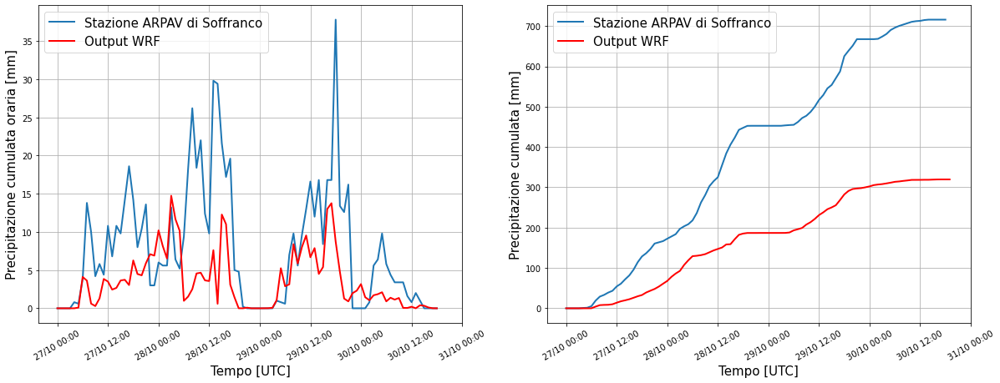

In [256]:
#wrf_prec = np.diff(wrf_prec)
fig, axs = plt.subplots(figsize = (20,7), nrows = 1, ncols = 2)

axs[0].plot(a.to_numpy()[:-6], label = "Stazione ARPAV di Soffranco", linewidth = 2)
axs[0].plot(wrf_prec, label = "Output WRF", color = "red", linewidth = 2)
axs[0].set_ylabel("Precipitazione cumulata oraria [mm]", fontsize = 15)
axs[0].set_xlabel("Tempo [UTC]", fontsize = 15)
axs[0].legend(fontsize = 15)
axs[0].grid()
axs[0].set_xticks(np.arange(0, 108, 12))

hours = ["00:00", "12:00"]

xticks = [str(d) + "/10 " + i for d in range(27,31) for i in hours]
xticks += ["31/10 00:00"]

axs[0].set_xticklabels(xticks, rotation = 30)

axs[1].plot(np.cumsum(a).to_numpy()[:-6], linewidth = 2, label = "Stazione ARPAV di Soffranco")
axs[1].plot(wrf_cum, color = "red", linewidth = 2, label = "Output WRF")
axs[1].set_ylabel("Precipitazione cumulata [mm]", fontsize = 15)
axs[1].set_xlabel("Tempo [UTC]", fontsize = 15)
axs[1].grid()
axs[1].set_xticks(np.arange(0, 108, 12))
axs[1].set_xticklabels(xticks, rotation = 30)
axs[1].legend(fontsize = 15)

fig.savefig("prectemp.pdf", bbox_inches = "tight")

In [224]:
hours = ["00:00", "12:00"]
xticks = [str(d) + "/10 " + i for d in range(27,31) for i in hours]
len(xticks)

8

In [231]:
a

DataOra  DataOra
27       0          0.0
         1          0.0
         2          0.0
         3          0.0
         4          0.8
                   ... 
30       20         0.0
         21         0.0
         22         0.0
         23         0.0
31       0          0.0
Name: Valore, Length: 97, dtype: float64

### Dati ERA5 (prova)

In [270]:
data_era5 = Dataset("dati_era5.nc")
lats_e, lons_e = data_era5.variables['latitude'][:], data_era5.variables['longitude'][:]
tp_e = data_era5.variables["tp"][3,:,:]*1000

data_era5.variables.keys()

dict_keys(['longitude', 'latitude', 'time', 'u10', 'v10', 't2m', 'msl', 'tp'])

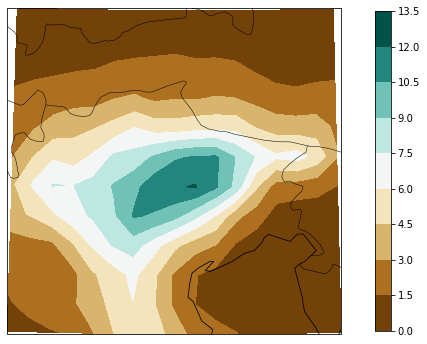

In [271]:
# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj_d03)

ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

plt.contourf(to_np(lons_e), to_np(lats_e), to_np(tp_e), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"))

plt.colorbar(ax=ax, shrink=.98)
 

#### Dominio 1

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


(-1331952.8862198978, 1332046.903799637)

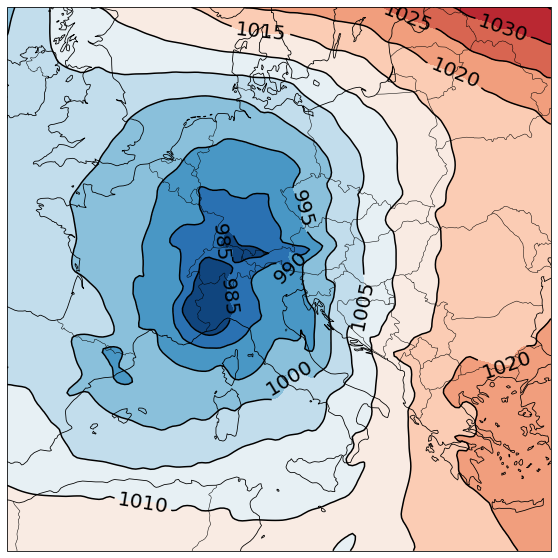

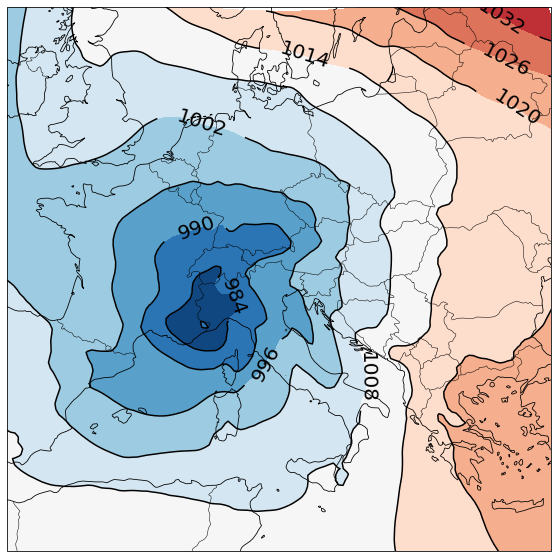

In [4]:
# Create a figure
fig = plt.figure(figsize=(10,10))
#fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10), subplot_kw = {"projection" : (crs.PlateCarree())})
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

ncfile = Dataset("wrfout_d01_2018-10-29_180000")
slp_w = getvar(ncfile, "slp")
lats, lons = latlon_coords(slp_w)

slp_w = smooth2d(slp_w, 3, cenweight=4)


ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

ax.contourf(to_np(lons), to_np(lats), to_np(slp_w), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("RdBu_r"))

cs = ax.contour(to_np(lons), to_np(lats), to_np(slp_w), 10, colors="black",
            transform=crs.PlateCarree())
ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)

ax.set_xlim(cartopy_xlim(slp_w))
ax.set_ylim(cartopy_ylim(slp_w))

####################################################################################

data_era5 = Dataset("dati_era5_d01.nc")
lats_e, lons_e = data_era5.variables['latitude'][:], data_era5.variables['longitude'][:]
slp_e = data_era5.variables["msl"][3,:,:]/100


# Create a figure
fig = plt.figure(figsize=(10,10))
#fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10), subplot_kw = {"projection" : (crs.PlateCarree())})
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

ax.contourf(to_np(lons_e), to_np(lats_e), to_np(slp_e), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("RdBu_r"))
cs = ax.contour(to_np(lons_e), to_np(lats_e), to_np(slp_e), 10, colors="black",
            transform=crs.PlateCarree())
ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)

ax.set_xlim(cartopy_xlim(slp_w))
ax.set_ylim(cartopy_ylim(slp_w))
#plt.colorbar(ax=ax, shrink=.98)

C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\feder\miniconda3\lib\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


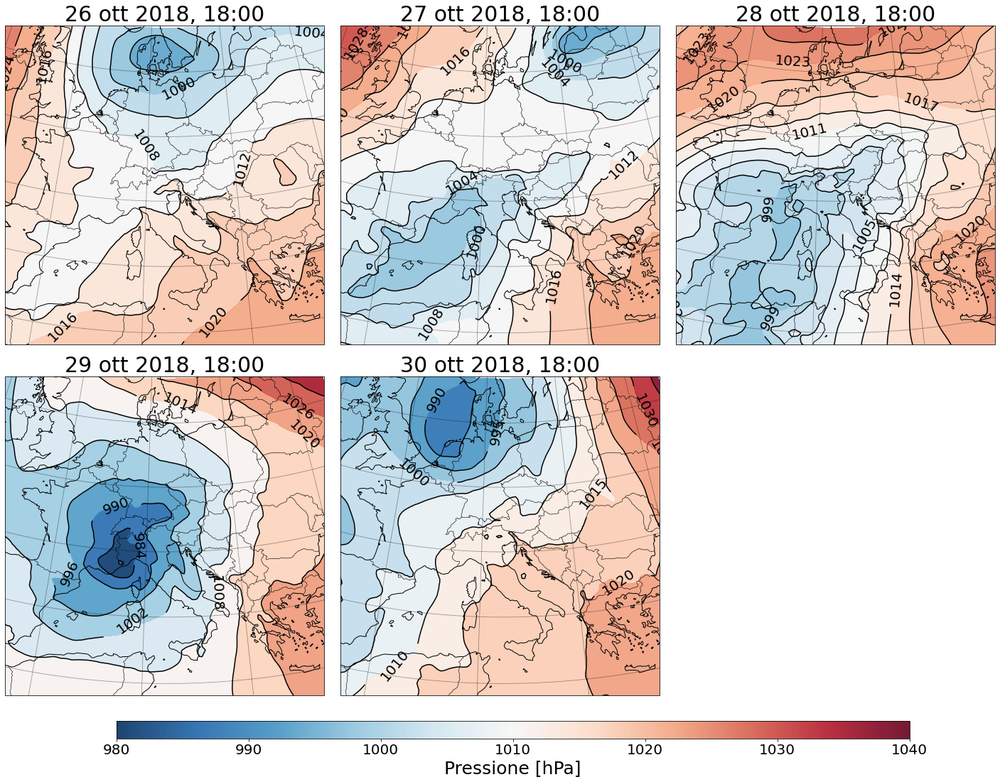

In [12]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["26", "27", "28", "29", "30"]

#fig.suptitle("Pressione al livello del mare [hPa]",
#            fontsize = 30)

lats, lons = data_era5.variables['latitude'][:], data_era5.variables['longitude'][:]

ncfile = Dataset("dati_era5_d01.nc")


for i, ax in zip(range(5), axs.ravel()):
    #namefile = "wrfout_d01_2018-10-"+i+"_180000"

# Get the sea level pressure
    slp = data_era5.variables["msl"][i,:,:]/100


# Smooth the sea level pressure since it tends to be noisy near the
# mountains
    #smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
    #lats, lons = latlon_coords(slp)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.6, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
    cs = ax.contour(to_np(lons), to_np(lats), to_np(slp), 10, colors="black",
            transform=crs.PlateCarree())
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)
    
    ax.contourf(to_np(lons), to_np(lats), to_np(slp), 10,
             transform=crs.PlateCarree(), alpha = 0.9,
             cmap=get_cmap("RdBu_r"), vmin = 980, vmax = 1040)

# Set the map bounds
    #ax.set_xlim(cartopy_xlim(slp))
    #ax.set_ylim(cartopy_ylim(slp))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")


    ax.set_title(str(i+26) + " ott 2018, 18:00",
                fontsize = 30)
    ax.set_xlim(cartopy_xlim(slp_w))
    ax.set_ylim(cartopy_ylim(slp_w))
# Add a color bar

fig.delaxes(axs[1,2])

#fig.tight_layout()


cmap = get_cmap("RdBu_r")
cmappable = ScalarMappable(norm=Normalize(980,1040), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.9)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Pressione [hPa]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)

#fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

fig.savefig('slp_era5.pdf', bbox_inches='tight')

In [47]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["26", "27", "28", "29", "30"]

#fig.suptitle("Pressione al livello del mare [hPa]",
#            fontsize = 30)

lats, lons = data_era5.variables['latitude'][:], data_era5.variables['longitude'][:]

ncfile = Dataset("dati_era5_d01.nc")


for i, ax in zip(range(5), axs.ravel()):
    #namefile = "wrfout_d01_2018-10-"+i+"_180000"

# Get the sea level pressure
    slp = data_era5.variables["msl"][i,:,:]/100


# Smooth the sea level pressure since it tends to be noisy near the
# mountains
    #smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
    #lats, lons = latlon_coords(slp)

# Download and add the states and coastlines
    ax.add_feature(states, linewidth=.6, edgecolor="black", zorder = 2)
    ax.coastlines('50m', linewidth=1, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
    cs = ax.contour(to_np(lons), to_np(lats), to_np(slp), 10, colors="black",
            transform=crs.PlateCarree())
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)
    
    ax.contourf(to_np(lons), to_np(lats), to_np(slp), 10,
             transform=crs.PlateCarree(), alpha = 0.9,
             cmap=get_cmap("RdBu_r"), vmin = 980, vmax = 1040)

# Set the map bounds
    #ax.set_xlim(cartopy_xlim(slp))
    #ax.set_ylim(cartopy_ylim(slp))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")


    ax.set_title(str(i+26) + " ott 2018, 18:00",
                fontsize = 30)
    ax.set_xlim(cartopy_xlim(slp_w))
    ax.set_ylim(cartopy_ylim(slp_w))
# Add a color bar

fig.delaxes(axs[1,2])

#fig.tight_layout()


cmap = get_cmap("RdBu_r")
cmappable = ScalarMappable(norm=Normalize(980,1040), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.9)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Pressione [hPa]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)

#fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

fig.savefig('slp_era5.pdf', bbox_inches='tight')

[-1354425.5309321308, 1309574.297727801]

### Confronto precipitazione

In [13]:
data_era5 = Dataset("dati_era5.nc")
lats_e, lons_e = data_era5.variables['latitude'][:], data_era5.variables['longitude'][:]
tp_e = data_era5.variables["tp"][3,:,:]*1000

ncfile = Dataset("wrfout_d03_2018-10-30_000000")

rainc, rainnc, rainsh = getvar(ncfile, "RAINC"), getvar(ncfile, "RAINNC"),  getvar(ncfile, "RAINSH")

ncfile = Dataset("wrfout_d03_2018-10-27_000000")

rainc_17, rainnc_17, rainsh_17 = getvar(ncfile, "RAINC"), getvar(ncfile, "RAINNC"),  getvar(ncfile, "RAINSH")

tp = to_np(rainc) + to_np(rainnc) + to_np(rainsh) - (to_np(rainc_17) + to_np(rainnc_17) + to_np(rainsh_17))

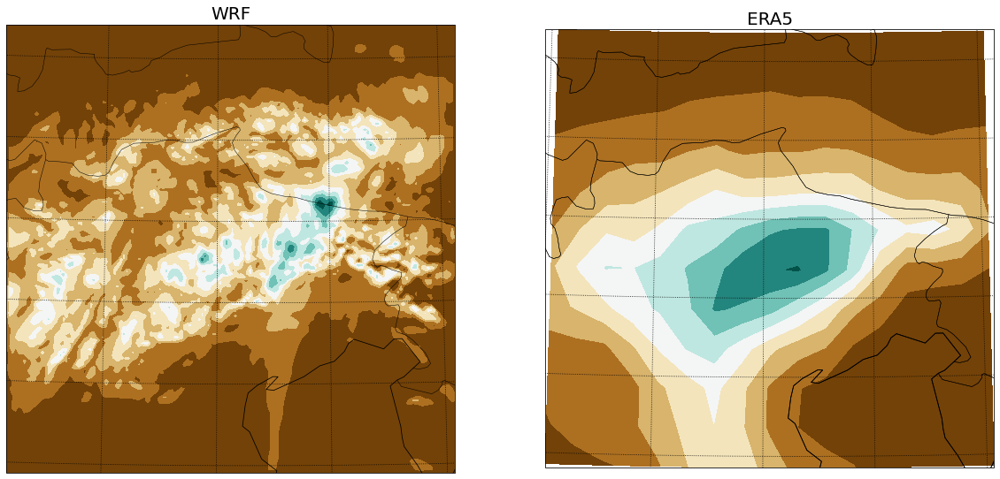

In [14]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(20,10), subplot_kw = {'projection' : cart_proj_d03})

axs[0].add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
axs[0].coastlines('50m', linewidth=.8, zorder = 2)

lats, lons = latlon_coords(rainc)

axs[0].contourf(to_np(lons), to_np(lats), tp, 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"))

axs[0].set_title("WRF", fontsize = 20)

axs[0].gridlines(color="black", linestyle="dotted")



#####################################################################à

axs[1].add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
axs[1].coastlines('50m', linewidth=.8, zorder = 2)


axs[1].add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
axs[1].coastlines('50m', linewidth=.8, zorder = 2)


axs[1].contourf(to_np(lons_e), to_np(lats_e), to_np(tp_e), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"))

axs[1].set_title("ERA5", fontsize = 20)

axs[1].gridlines(color="black", linestyle="dotted")


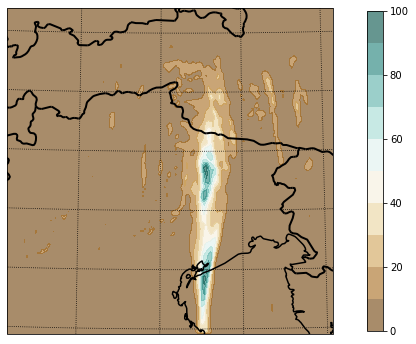

In [73]:
# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
states = NaturalEarthFeature(category="cultural", scale="10m",
                             facecolor="none",
                             name="admin_0_boundary_lines_land")
ax.add_feature(states, linewidth=2, edgecolor="black", zorder = 2)
ax.coastlines('10m', linewidth=1.5, zorder = 2, alpha = 1)

lats, lons = latlon_coords(rainc)
# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
#plt.contour(to_np(lons), to_np(lats), to_np(smooth_slp), 10, colors="black", alpha = 0.6,
#            transform=crs.PlateCarree())
plt.contourf(to_np(lons), to_np(lats), tp, 10, alpha = 0.6,
             transform=crs.PlateCarree(),
             cmap=get_cmap("BrBG"))

# Add a color bar
plt.colorbar(ax=ax, shrink=.98)

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")


plt.show()

## Profili verticali

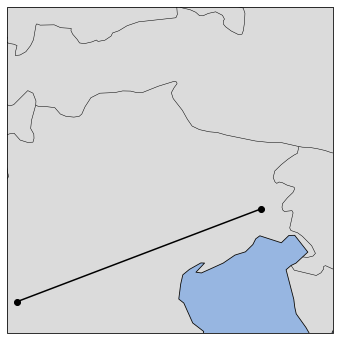

In [169]:
ncfile = Dataset("wrfout_d03_2018-10-26_000000")

slp = getvar(ncfile, "slp")
lats, lons = latlon_coords(slp)
cart_proj_d03 = get_cartopy(slp)


fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj_d03)

# Download and add the states and coastlines
#ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('50m', linewidth=.8, zorder = 2)

ax.add_feature(LAND)
ax.add_feature(ocean)
ax.add_feature(land)
ax.add_feature(states, linewidth=.5, edgecolor="black")

#ax.text(15, 'Mar Adriatico')

# Start ed end point 
start_point = CoordPair(lat=45.2, lon=10.29)
end_point = CoordPair(lat=46.0, lon=13.23)


staz_coords = []
for i, j in zip(coord_staz.EPSG4258_LAT, coord_staz.EPSG4258_LON):
    staz_coords += [CoordPair(lat=i, lon=j)]
    

ax.plot([start_point.lon, end_point.lon],
            [start_point.lat, end_point.lat], color="black", marker="o",
            transform=crs.PlateCarree(), zorder=5)

#ax.scatter([staz_coords[i].lon for i in range(len(staz_coords))], [staz_coords[i].lat for i in range(len(staz_coords))],
#       transform=crs.PlateCarree(), zorder = 4, color = 'red')

ax.set_xlim(cartopy_xlim(slp))
ax.set_ylim(cartopy_ylim(slp))

plt.savefig("d03.pdf", bbox_inches = "tight")

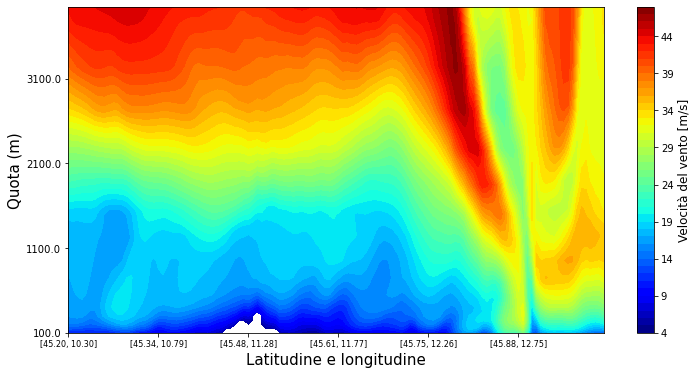

In [148]:
filename = "wrfout_d03_2018-10-29_180000"
ncfile = Dataset(filename)

# Extract the model height and wind speed
z = getvar(ncfile, "z")
wspd =  getvar(ncfile, "uvmet_wspd_wdir")[0,:]

# Create the start point and end point for the cross section
start_point = CoordPair(lat=45.2, lon=10.29)
end_point = CoordPair(lat=46.0, lon=13.23)

# Compute the vertical cross-section interpolation.  Also, include the
# lat/lon points along the cross-section.
levels = np.arange(100, 4000, 50)
wspd_cross = vertcross(wspd, z, wrfin=ncfile, start_point=start_point,
                       end_point=end_point, latlon=True, meta=True, levels = levels)

# Create the figure
fig = plt.figure(figsize=(12,6))
ax = plt.axes()

# Make the contour plot
wspd_contours = ax.contourf(to_np(wspd_cross), cmap=get_cmap("jet"), levels = 50)

# Add the color bar
cbar = plt.colorbar(wspd_contours, ax=ax)

cbar.set_label("Velocità del vento [m/s]", fontsize = 12)

# Set the x-ticks to use latitude and longitude labels.
coord_pairs = to_np(wspd_cross.coords["xy_loc"])
x_ticks = np.arange(coord_pairs.shape[0])
x_labels = [pair.latlon_str(fmt="[{:.2f}, {:.2f}]")
            for pair in to_np(coord_pairs)]
ax.set_xticks(x_ticks[::20])
ax.set_xticklabels(x_labels[::20], fontsize=8)

# Set the y-ticks to be height.
vert_vals = to_np(wspd_cross.coords["vertical"])
v_ticks = np.arange(vert_vals.shape[0])
ax.set_yticks(v_ticks[::20])
ax.set_yticklabels(vert_vals[::20], fontsize=10)

# Set the x-axis and  y-axis labels
ax.set_xlabel("Latitudine e longitudine", fontsize=15)
ax.set_ylabel("Quota (m)", fontsize=15)


plt.savefig("vert_wind.pdf", bbox_inches = "tight")

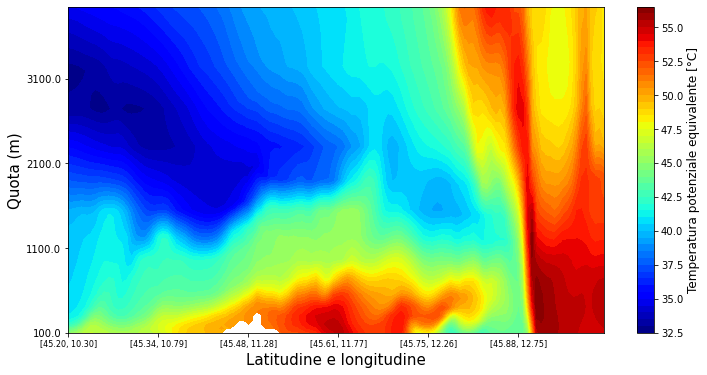

In [149]:
filename = "wrfout_d03_2018-10-29_180000"
ncfile = Dataset(filename)

# Extract the model height and wind speed
z = getvar(ncfile, "z")
temp =  getvar(ncfile, "eth", units = "degC")

# Create the start point and end point for the cross section
start_point = CoordPair(lat=45.2, lon=10.29)
end_point = CoordPair(lat=46.0, lon=13.23)

# Compute the vertical cross-section interpolation.  Also, include the
# lat/lon points along the cross-section.
levels = np.arange(100, 4000, 50)
temp_cross = vertcross(temp, z, wrfin=ncfile, start_point=start_point,
                       end_point=end_point, latlon=True, meta=True, levels = levels)

# Create the figure
fig = plt.figure(figsize=(12,6))
ax = plt.axes()

# Make the contour plot
temp_contours = ax.contourf(to_np(temp_cross), cmap=get_cmap("jet"), levels = 50)#, vmin = 300, vmax = 330)

# Add the color bar
cbar = plt.colorbar(temp_contours, ax=ax)
cbar.set_label("Temperatura potenziale equivalente [°C]", fontsize = 12)

# Set the x-ticks to use latitude and longitude labels.
coord_pairs = to_np(temp_cross.coords["xy_loc"])
x_ticks = np.arange(coord_pairs.shape[0])
x_labels = [pair.latlon_str(fmt="[{:.2f}, {:.2f}]")
            for pair in to_np(coord_pairs)]
ax.set_xticks(x_ticks[::20])
ax.set_xticklabels(x_labels[::20], fontsize=8)

# Set the y-ticks to be height.
vert_vals = to_np(temp_cross.coords["vertical"])
v_ticks = np.arange(vert_vals.shape[0])
ax.set_yticks(v_ticks[::20])
ax.set_yticklabels(vert_vals[::20], fontsize=10)

# Set the x-axis and  y-axis labels
ax.set_xlabel("Latitudine e longitudine", fontsize=15)
ax.set_ylabel("Quota (m)", fontsize=15)


#plt.title("Vertical Cross Section of Wind Speed (kt)")

plt.savefig("vert_temp.pdf", bbox_inches = "tight")

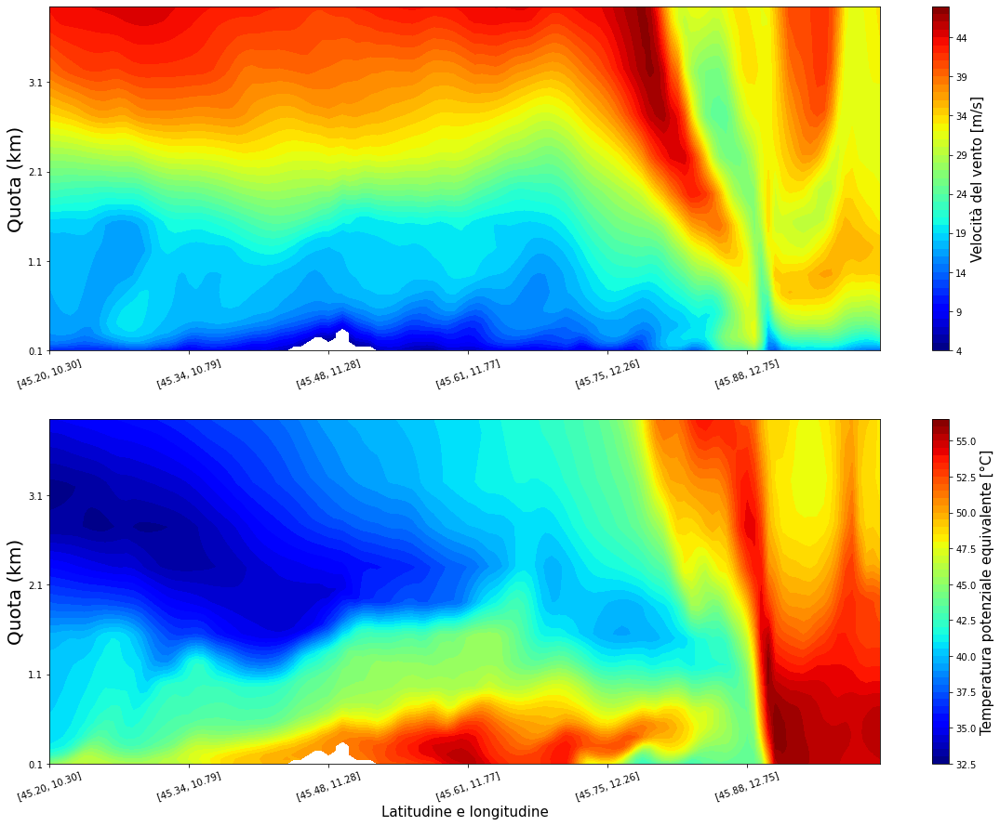

In [167]:
fig = plt.figure(figsize=(20,15))
ax_wspd = fig.add_subplot(2,1,1)
ax_temp = fig.add_subplot(2,1,2)
#ax_reg = fig.add_subplot(2,3,3, projection=cart_proj)


wspd_contours = ax_wspd.contourf(to_np(wspd_cross), cmap=get_cmap("jet"), levels = 50)

temp_contours = ax_temp.contourf(to_np(temp_cross), cmap=get_cmap("jet"), levels = 50)

#v_ticks = np.arange(0,4000,50)
#ax_wspd.set_yticklabels(v_ticks[::20])

cbar_wspd = plt.colorbar(wspd_contours, ax = ax_wspd)
cbar_wspd.set_label("Velocità del vento [m/s]", fontsize = 15)

cbar_temp = plt.colorbar(temp_contours, ax = ax_temp)
cbar_temp.set_label("Temperatura potenziale equivalente [°C]", fontsize = 15)

coord_pairs = to_np(temp_cross.coords["xy_loc"])
x_ticks = np.arange(coord_pairs.shape[0])
x_labels = [pair.latlon_str(fmt="[{:.2f}, {:.2f}]")
            for pair in to_np(coord_pairs)]
ax_wspd.set_xticks(x_ticks[::20])
ax_wspd.set_xticklabels(x_labels[::20], fontsize=10, rotation = 20)

ax_temp.set_xticks(x_ticks[::20])
ax_temp.set_xticklabels(x_labels[::20], fontsize=10, rotation = 20)

vert_vals = to_np(temp_cross.coords["vertical"])
v_ticks = np.arange(vert_vals.shape[0])

ax_wspd.set_yticks(v_ticks[::20])
ax_wspd.set_yticklabels(vert_vals[::20]/1000, fontsize=10)

ax_temp.set_yticks(v_ticks[::20])
ax_temp.set_yticklabels(vert_vals[::20]/1000, fontsize=10)

#ax_wspd.set_xlabel("Latitudine e longitudine", fontsize=15)
ax_wspd.set_ylabel("Quota (km)", fontsize=20)

ax_temp.set_xlabel("Latitudine e longitudine", fontsize=15)
ax_temp.set_ylabel("Quota (km)", fontsize=20)

fig.savefig("vertcross.pdf", bbox_inches = "tight")

In [133]:
ax_reg.add_feature(LAND)
ax_reg.add_feature(ocean)
ax_reg.add_feature(land)
ax_reg.add_feature(states, linewidth=.5, edgecolor="black")

ax_reg.plot([start_point.lon, end_point.lon],
            [start_point.lat, end_point.lat], color="black", marker="o",
            transform=crs.PlateCarree(), zorder=5)

#ax_reg.scatter([staz_coords[i].lon for i in range(len(staz_coords))], [staz_coords[i].lat for i in range(len(staz_coords))],
#       transform=crs.PlateCarree(), zorder = 4, color = 'red')

ax_reg.set_xlim(cartopy_xlim(slp))
ax_reg.set_ylim(cartopy_ylim(slp))

Help on ndarray object:

class ndarray(builtins.object)
 |  ndarray(shape, dtype=float, buffer=None, offset=0,
 |          strides=None, order=None)
 |  
 |  An array object represents a multidimensional, homogeneous array
 |  of fixed-size items.  An associated data-type object describes the
 |  format of each element in the array (its byte-order, how many bytes it
 |  occupies in memory, whether it is an integer, a floating point number,
 |  or something else, etc.)
 |  
 |  Arrays should be constructed using `array`, `zeros` or `empty` (refer
 |  to the See Also section below).  The parameters given here refer to
 |  a low-level method (`ndarray(...)`) for instantiating an array.
 |  
 |  For more information, refer to the `numpy` module and examine the
 |  methods and attributes of an array.
 |  
 |  Parameters
 |  ----------
 |  (for the __new__ method; see Notes below)
 |  
 |  shape : tuple of ints
 |      Shape of created array.
 |  dtype : data-type, optional
 |      Any objec

# Backup

In [90]:
from wrf import getvar

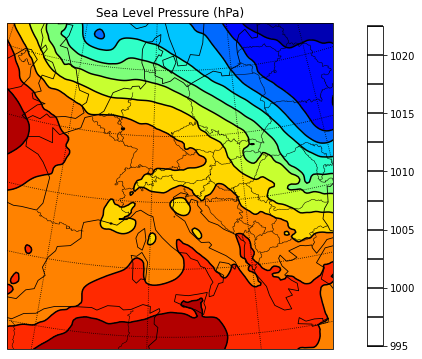

In [91]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature

from wrf import (to_np, getvar, smooth2d, get_cartopy, cartopy_xlim,
                 cartopy_ylim, latlon_coords, interplevel)
ncfile = Dataset("wrfout_d01_2018-10-26_000000")

# Get the sea level pressure
slp = getvar(ncfile, "slp")

# Smooth the sea level pressure since it tends to be noisy near the
# mountains
smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
lats, lons = latlon_coords(slp)

# Get the cartopy mapping object
cart_proj = get_cartopy(slp)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
states = NaturalEarthFeature(category="cultural", scale="10m",
                             facecolor="none",
                             name="admin_0_boundary_lines_land")
ax.add_feature(states, linewidth=.5, edgecolor="black", zorder = 2)
ax.coastlines('110m', linewidth=.8, zorder = 2)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
plt.contour(to_np(lons), to_np(lats), to_np(smooth_slp), 10, colors="black",
            transform=crs.PlateCarree())
ax.contourf(to_np(lons), to_np(lats), to_np(smooth_slp), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("jet"))

# Add a color bar
plt.colorbar(ax=ax, shrink=.98)

# Set the map bounds
ax.set_xlim(cartopy_xlim(smooth_slp))
ax.set_ylim(cartopy_ylim(smooth_slp))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

plt.title("Sea Level Pressure (hPa)")

plt.show()

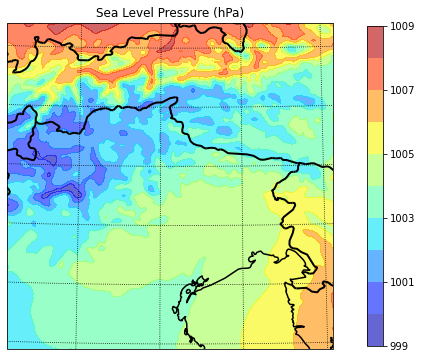

In [92]:
# Open the NetCDF file
ncfile = Dataset("wrfout_d03_2018-10-27_120000")

# Get the sea level pressure
slp = getvar(ncfile, "slp")


# Smooth the sea level pressure since it tends to be noisy near the
# mountains
smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
lats, lons = latlon_coords(slp)

# Get the cartopy mapping object
cart_proj = get_cartopy(slp)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
states = NaturalEarthFeature(category="cultural", scale="10m",
                             facecolor="none",
                             name="admin_0_boundary_lines_land")
ax.add_feature(states, linewidth=2, edgecolor="black", zorder = 2)
ax.coastlines('10m', linewidth=1.5, zorder = 2, alpha = 1)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
#plt.contour(to_np(lons), to_np(lats), to_np(smooth_slp), 10, colors="black", alpha = 0.6,
#            transform=crs.PlateCarree())
plt.contourf(to_np(lons), to_np(lats), to_np(smooth_slp), 10, alpha = 0.6,
             transform=crs.PlateCarree(),
             cmap=get_cmap("jet"))

# Add a color bar
plt.colorbar(ax=ax, shrink=.98)

# Set the map bounds
ax.set_xlim(cartopy_xlim(smooth_slp))
ax.set_ylim(cartopy_ylim(smooth_slp))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

plt.title("Sea Level Pressure (hPa)")

plt.show()

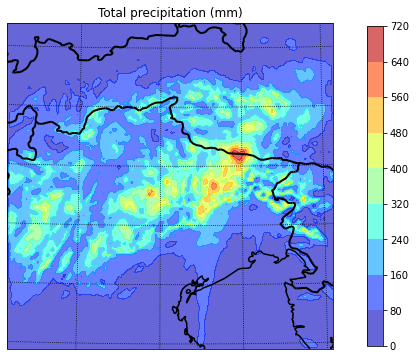

In [93]:
# Open the NetCDF file
ncfile = Dataset("wrfout_d03_2018-10-30_120000")

# Get the total precipitation
prec = getvar(ncfile, "RAINC") 
prec += getvar(ncfile, "RAINNC")

# Smooth the sea level pressure since it tends to be noisy near the
# mountains
#smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
lats, lons = latlon_coords(prec)

# Get the cartopy mapping object
cart_proj = get_cartopy(prec)

# Create a figure
fig = plt.figure(figsize=(12,6))
# Set the GeoAxes to the projection used by WRF
ax = plt.axes(projection=cart_proj)

# Download and add the states and coastlines
states = NaturalEarthFeature(category="cultural", scale="10m",
                             facecolor="none",
                             name="admin_0_boundary_lines_land")
ax.add_feature(states, linewidth=2, edgecolor="black", zorder = 2)
ax.coastlines('10m', linewidth=1.5, zorder = 2, alpha = 1)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
#plt.contour(to_np(lons), to_np(lats), to_np(smooth_slp), 10, colors="black", alpha = 0.6,
#            transform=crs.PlateCarree())
plt.contourf(to_np(lons), to_np(lats), to_np(prec), 10, alpha = 0.6,
             transform=crs.PlateCarree(),
             cmap=get_cmap("jet"))

# Add a color bar
plt.colorbar(ax=ax, shrink=.98)

# Set the map bounds
ax.set_xlim(cartopy_xlim(prec))
ax.set_ylim(cartopy_ylim(prec))

# Add the gridlines
ax.gridlines(color="black", linestyle="dotted")

plt.title("Total precipitation (mm)")

plt.show()

IndexError: index 2 is out of bounds for axis 1 with size 2

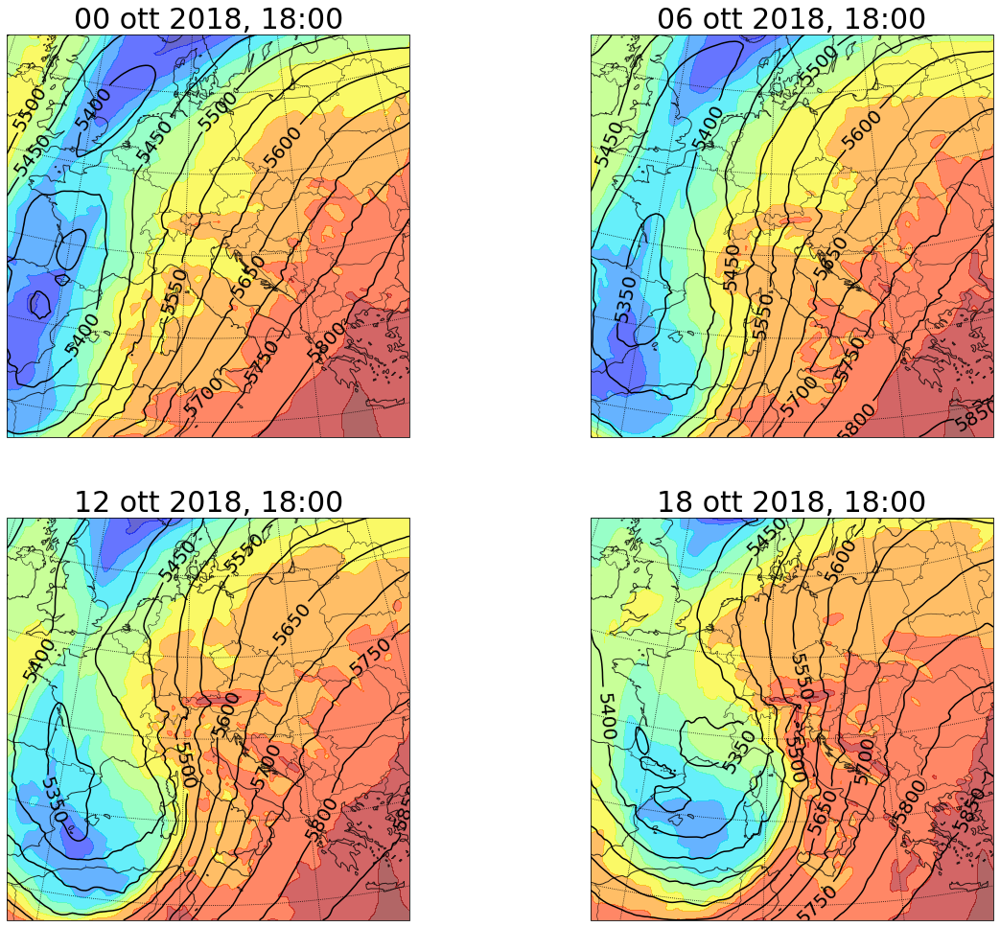

In [10]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 17), subplot_kw = {'projection' : cart_proj})

days_list = ["00", "06", "12", "18"]

#fig.suptitle("Altezza di geopotenziale [m] (contorni) e temperatura [°C] (colori) a 500 hPa",
#            fontsize = 30)

for i, ax in zip(days_list, axs.ravel()):
    namefile = "wrfout_d01_2018-10-29_"+i+"0000"
    ncfile = Dataset(namefile)

# Get the geopotential height, the pressure profile and the temperature in Celsius degrees
    gpt = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    t = getvar(ncfile, "tc")


# Interpolate the geopotential height and the temperature at 500 hPa
    interp_gpt = interplevel(gpt, p, 500)
    interp_t = interplevel(t, p, 500)

# Smooth the sea level pressure since it tends to be noisy near the
# mountains
#smooth_slp = smooth2d(slp, 3, cenweight=4)

# Get the latitude and longitude points
    lats, lons = latlon_coords(interp_gpt)

# Download and add the states and coastlines

    ax.add_feature(states, linewidth=.6, edgecolor="black", zorder = 2, alpha = 0.8)
    ax.coastlines('50m', linewidth=1, zorder = 2, alpha = 0.8)

# Make the contour outlines and filled contours for the smoothed sea level
# pressure.
    cs = ax.contour(to_np(lons), to_np(lats), to_np(interp_gpt), 10, colors="black", 
            transform=crs.PlateCarree())
    ax.clabel(cs, inline=1, fontsize=20, colors = 'black', zorder = 3)
    ax.contourf(to_np(lons), to_np(lats), to_np(interp_t), 10,
             transform=crs.PlateCarree(),
             cmap=get_cmap("jet"), alpha = 0.6,
               vmin = -35, vmax = -10)


# Set the map bounds
    ax.set_xlim(cartopy_xlim(interp_gpt))
    ax.set_ylim(cartopy_ylim(interp_gpt))

# Add the gridlines
    ax.gridlines(color="black", linestyle="dotted")

    ax.set_title(i + " ott 2018, 18:00",
                fontsize = 30)
# Add a color bar

fig.delaxes(axs[1,2])

fig.tight_layout()


cmap = get_cmap("jet")
cmappable = ScalarMappable(norm=Normalize(-35,-10), cmap=cmap)

p0 = axs[0,0].get_position().get_points().flatten()
p1 = axs[0,2].get_position().get_points().flatten()

ax_cbar = fig.add_axes([p0[0], 0.1, p1[2]-p0[0], 0.02])
cbar = fig.colorbar(cmappable, cax=ax_cbar, orientation='horizontal', shrink=.5, alpha = 0.7)
cbar.ax.tick_params(labelsize=20) 
cbar.set_label("Temperatura [°C]", fontsize=25)
fig.subplots_adjust(top = 0.92, bottom = 0.15, hspace = 0.1, wspace = 0.01, left = 0.01, right = 0.99)

#fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

#fig.savefig('gph+t.pdf', bbox_inches='tight')